本文档主要是验证不同的滤波器对噪声控制的效果。

In [88]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from scipy.signal import fftconvolve

import IPython
import pyroomacoustics as pra


为了仿真声音在房间的传播需要进行以下几个步骤的设置：

- (1) 创建房间模型
- (2) 添加声源和误差麦克风
- (3) 房间脉冲响应（RIR）生成器与传播仿真
- (4) 设计自适应滤波器用于根据输入计算第二个通道的反向抵消噪声
- (5) ,对误差麦克的降噪进行评价，并可视化结果

In [89]:
# 原始噪声信号
# fs, Noise_Source = wavfile.read("google_speech_commands/_background_noise_/pink_noise.wav")
fs, Noise_Source = wavfile.read("/home/liang/文档/Coding/Machine Learning/Pyroomacoustics_demo/google_speech_commands/_background_noise_/doing_the_dishes.wav")

"""(4) : 设计自适应滤波器用于根据输入计算第二个通道的反向抵消噪声"""

# 滤波器超参数
length = 15     # 滤波器长度
n_samples = len(Noise_Source)   # 处理的信号长度

# 设置滤波器权重参数
w  = np.random.randn(length)
w /= np.linalg.norm(w)          # 对滤波器参数进行范数正则化处理

# 参考输出 d 的计算过程：输入信号与滤波器进行卷积操作
d = fftconvolve(Noise_Source, w)[:n_samples]    # 保证参考输出 d 的长度与 处理的信号长度 n_samples 保持一致

# 设置自适应滤波器字典
adfilt = dict(
    # 滤波器算法1： NLMS 自适应滤波器算法
    nlms = dict(
        filter = pra.adaptive.NLMS(length, mu=0.5),
        error  = np.zeros(n_samples),
    ),

    # 滤波器算法2： RLS 自适应滤波器算法
    rls = dict(
        filter = pra.adaptive.RLS(length, lmbd=1, delta=2.0),
        error  = np.zeros(n_samples),
    ),

    # 滤波器算法3： BLOCK_RLS 自适应滤波器算法
    blockrls = dict(
        filter = pra.adaptive.BlockRLS(length, lmbd=1., delta=2.0),
        error  = np.zeros(n_samples),
    ),
)

# 对 adfilt 中的每个自适应滤波器进行参数迭代更新，并计算第二通道的反向抵消信号
for i in range(n_samples):
    for algo in adfilt.values():
        # 使用输入信号 x 与参考信号 d 对每个自适应滤波器进行迭代更新
        algo['filter'].update(Noise_Source[i], d[i])
        algo['error'][i] = np.linalg.norm(algo['filter'].w - w)

# 根据训练好的自适应滤波器组 adfilt 中的每个滤波器计算响应的第二个通道的音频输出
# 滤波器算法1： NLMS 自适应滤波器算法的第二通道输出
Noise_S_NLMS = fftconvolve(Noise_Source, adfilt['nlms']['filter'].w)

# 滤波器算法1： NLMS 自适应滤波器算法的第二通道输出
Noise_S_RLS = fftconvolve(Noise_Source, adfilt['rls']['filter'].w)

# 滤波器算法1： NLMS 自适应滤波器算法的第二通道输出
Noise_S_BLOCKRLS = fftconvolve(Noise_Source, adfilt['blockrls']['filter'].w)

# room.add_microphone([2.18, 0.55, 0.6], fs)

# 将经过优化后的滤波器的噪声信号作为声源，添加到第二通道处
# room.add_source([2.18, 0.55, 0.6], signal=Noise_S_RLS)  # 基于 RLS 算法的模型

/tmp/ipykernel_17803/3214122263.py:3: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, Noise_Source = wavfile.read("/home/liang/文档/Coding/Machine Learning/Pyroomacoustics_demo/google_speech_commands/_background_noise_/doing_the_dishes.wav")
/home/liang/miniconda3/envs/ML_ANC/lib/python3.8/site-packages/pyroomacoustics/adaptive/lms.py:48: RuntimeWarning: invalid value encountered in divide
  self.w += self.mu * e * self.x / np.inner(self.x, self.x)


有了自适应滤波器后，在模拟的房间中进行算法测试

In [134]:
"""(1) : 构造房间模型"""

# 首先设置 2D 房间节点（顺时针旋转）
corners = np.array([[0, 0], [0, 1.1], [2.2, 1.1], [2.2, 0]]).T

# 首先构造一个 2D 房间：并设置房间的频率属性、ray_tracing、空气吸收率（air_absorption）、最大阶数（max_order）、材料（materials）参数进行设置，并生成新的 2D 房间 room 对象
room = pra.Room.from_corners(corners, fs=fs, ray_tracing=True, max_order=3, materials=pra.Material(0.2, 0.15), air_absorption=True)

# 使用 extrude() 方法构造 3D 房间
room.extrude(1.2, materials=pra.Material(0.2, 0.15))

# 设置 ray_tracing 参数：接收半径（receiver_radius）、n_ray、energy_thres
room.set_ray_tracing(receiver_radius=0.5, n_rays=1000, energy_thres=1e-5)

"""(2) : 添加声源与测试算法设计麦克风"""

# 使用 add_source() 方法在 [0.02, 0.55] 处添加信号源 signal，该音源是作为系统的输入，即第一个通道的信号源。
room.add_source([0.02, 0.55, 0.6], signal=Noise_Source)

# 使用 add_microphone() 方法在房间的最中心添加误差麦克风，用于测试算法的处理效果
room.add_microphone([1.1, 0.55, 0.6], fs)

# 添加第二通道的噪声消除音源
# room.add_source([2.18, 0.55, 0.6], signal=Noise_S_NLMS)

# room.add_source([2.18, 0.55, 0.6], signal=Noise_S_RLS)

room.add_source([2.18, 0.55, 0.6], signal=Noise_S_BLOCKRLS)

"""(3) : 房间脉冲响应 (RIR) 生成器与传播仿真"""

# 使用 room 的 image_source_model() 类方法计算房间 room 对象的麦克风脉冲响应
room.image_source_model()

# 使用 room 的 plot_rir() 类方法绘制麦克风的 RIR
# room.plot_rir()

# 对房间进行仿真
room.simulate()

# 评价指标的计算
from pesq import pesq

pesq(fs, Noise_Source, room.mic_array.signals[0,:])

3.5634961128234863

In [98]:
print("原始信号：")
IPython.display.Audio(Noise_Source, rate=fs)

原始信号：


In [113]:
# 查看信号的处理效果
print("NLMS 测试麦克风处的信号：")
IPython.display.Audio(room.mic_array.signals[0,:], rate=fs)

NLMS 测试麦克风处的信号：


In [93]:
# 查看信号的处理效果
print("NLMS 算法误差麦克风处的信号：")
IPython.display.Audio(Noise_S_NLMS, rate=fs)

NLMS 算法误差麦克风处的信号：


In [94]:
# 查看信号的处理效果
print("RLS 算法误差麦克风处的信号：")
IPython.display.Audio(Noise_S_RLS, rate=fs)

RLS 算法误差麦克风处的信号：


In [95]:
# 查看信号的处理效果
print("BLOCKRLS 算法误差麦克风处的信号：")
IPython.display.Audio(Noise_S_BLOCKRLS, rate=fs)

BLOCKRLS 算法误差麦克风处的信号：


绘制每种自适应算法的处理结果

/tmp/ipykernel_17803/1981129460.py:13: MatplotlibDeprecationWarning: The label function was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use Tick.label1 instead.
  tick.label.set_fontsize(20)
/tmp/ipykernel_17803/1981129460.py:16: MatplotlibDeprecationWarning: The label function was deprecated in Matplotlib 3.1 and will be removed in 3.8. Use Tick.label1 instead.
  tick.label.set_fontsize(20)


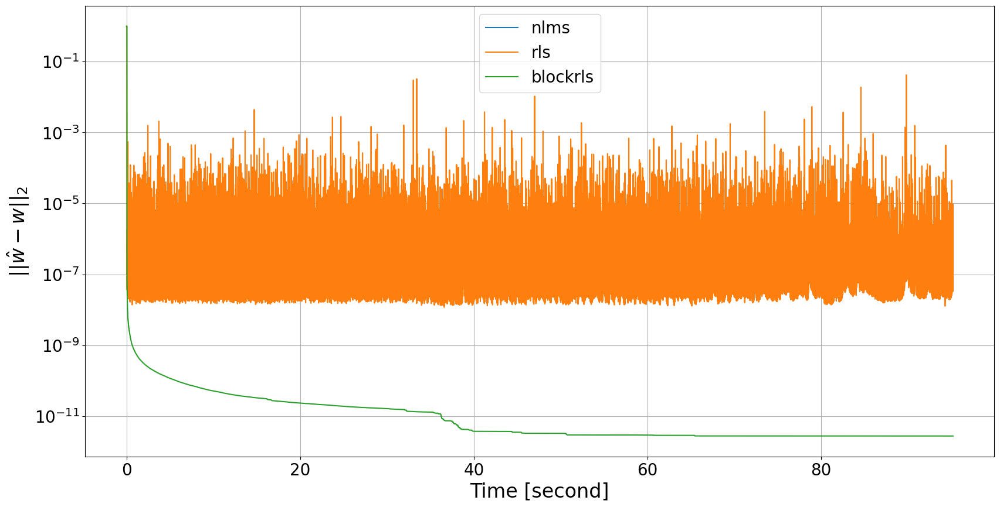

In [96]:
plt.figure()

for algo in adfilt.values():
    plt.semilogy(np.arange(n_samples) / fs, algo['error'])

plt.legend(adfilt, fontsize=20)
plt.ylabel("$\||\hat{w}-w\||_2$", fontsize=24)
plt.xlabel("Time [second]", fontsize=24)

# 设置坐标轴刻度的字体大小
ax = plt.gca()
for tick in ax.xaxis.get_major_ticks():
    tick.label.set_fontsize(20)

for tick in ax.yaxis.get_major_ticks():
    tick.label.set_fontsize(20)

plt.grid()
fig = plt.gcf()
fig.set_size_inches(20, 10)

## 语音性能度量指标

这里使用 [schmiph2/pysepm: Python implementation of performance metrics in Loizou's Speech Enhancement book](https://github.com/schmiph2/pysepm) 第三方包实现。

`pysepm` 是语音增强性能度量（语音质量与可懂性），其主要包括一下三类指标：

##### 1、语音质量指标（Speech Quality Measures）
- (1) 分段信号与音频比率（`SNRseg`, Segmental Signal-to-Noise Ratio）
- (2) 频率加权分段信躁比（`fwSNRseg`, Frequency-weighted Segmental SNR）
- (3) 对数似然比（`LLR`, Log-likelihood Ratio）
- (4) 加权频谱斜率（`WSS`, Weighted Spectral Slope）
- (5) 感知语音质量评价（`PESQ`, Perceptual Evaluation of Speech Quality, 可以参考 [`python-pesq`](https://github.com/ludlows/PESQ) 由 ludlows 实现）
- (6) 合成目标语音质量（`COSQ`, Composite Objective Speech Quality）
- (7) 倒谱距离客观语音质量指标（`CD`, Cepstrum Distance Objective Speech Quality Measure）

##### 2、语音清晰度测量（Speech Intelligibility Measures）
- (1) 短时目标清晰度（`STOI`, Short-Time Objective Intelligibility）([pystoi](https://github.com/mpariente/pystoi) 由 mpariente 实现)
- (2) 连贯性和语音可懂指数（`CSII`, Coherence and Speech Intelligibility Index）
- (3) 归一化协方差测度（`NCM`, Normalized-Covariance Measure）

##### 3、Dereverberation Measures (TODO)
+ Bark spectral distortion (BSD)
+ Scale-invariant signal to distortion ratio (SI-SDR)